In [2]:
import database_functions as func
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import json
import requests
from eda_functions import choropleth
%matplotlib inline

# Create a Database instance
path = r'009_supplemental\cleaned data'
db = func.Database(path)
print("Database initialized successfully.")
# Assuming db is your Database instance

Database initialized successfully.


c:\Users\kasra\OneDrive\Desktop\Code\MSI\milestone_1\004_data-processing-scripts\002_clean-raw-data\database_functions.py:101: DtypeWarning: Columns (8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(os.path.join(directory_path, file_name))


# Facility Records Dataset

## Task 1: Basic statistics and data overview of the 'fascility' table

In [59]:

def load_fascility_records(db=None):
    
    if db is None:
        db = func.Database()
        
    # Load the fascility_records table
    fascility_records_df = db.fascility_records()

    # remove '_1' from the column names, '_1' was added to the column names to avoid conflicts with the column names from aggregated fasciltiy table
    fascility_records_df.columns = [col.replace('_1', '') for col in fascility_records_df.columns]

    # cast mortality_rate_facility and readmission_rate_facility to numeric
    fascility_records_df['mortality_rate_facility'] = pd.to_numeric(fascility_records_df['mortality_rate_facility'], errors='coerce')   
    fascility_records_df['readmission_rate_facility'] = pd.to_numeric(fascility_records_df['readmission_rate_facility'], errors='coerce')
    
    view_columns = ['year', 'county_name', 'stations', 'prof_np', 'chain_own', 'chain_org', 'mortality_rate_facility', 'readmission_rate_facility', 'patient_hospital_readmission_category', 'fac_star', 'xp_star', 'staff_scr']
    db.fascility_records.add_view('quality_of_care', view_columns)
    # Sort the dataframe by year and county_name
    fascility_records_df = db.fascility_records.quality_of_care.sort_values(['year', 'county_name']).reset_index(drop=True)

    return fascility_records_df

fascility_records_df = load_fascility_records(db)
print(fascility_records_df.describe().T)

                             count         mean       std     min     25%  \
year                       37738.0  2021.027717  1.979136  2018.0  2019.0   
stations                   37741.0    20.639517  9.508625     0.0    16.0   
mortality_rate_facility    35434.0    21.802489  6.728506     0.0    17.6   
readmission_rate_facility  35342.0    26.576122  7.373863     0.0    22.1   
fac_star                   23504.0     3.663802  0.957137     1.0     3.0   
xp_star                     6564.0     3.476234  0.826140     1.0     3.0   
staff_scr                  23504.0    87.284717  3.733921    70.0    85.0   

                              50%     75%     max  
year                       2021.0  2023.0  2024.0  
stations                     21.0    25.0    76.0  
mortality_rate_facility      21.0    24.9    83.5  
readmission_rate_facility    26.6    30.9    70.6  
fac_star                      4.0     4.0     5.0  
xp_star                       4.0     4.0     5.0  
staff_scr          

Missing value counts:
year                                         3
county_name                                800
stations                                     0
prof_np                                      0
chain_own                                    0
chain_org                                    6
mortality_rate_facility                   2307
readmission_rate_facility                 2399
patient_hospital_readmission_category     4448
fac_star                                 14237
xp_star                                  31177
staff_scr                                14237
dtype: int64


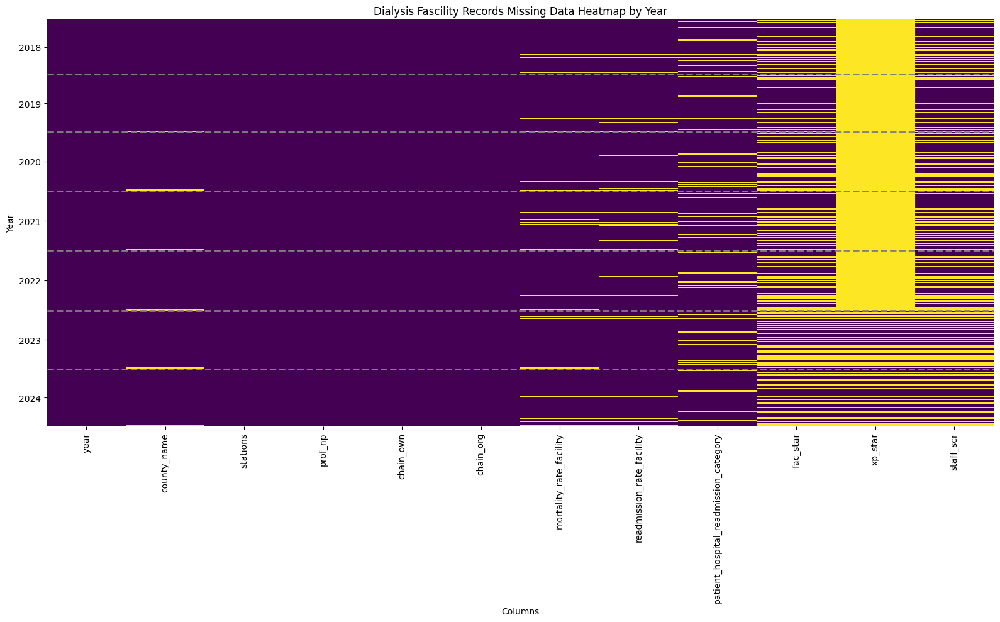

In [56]:
def plot_missing_data_heatmap(df):
    
    # Create the heatmap
    plt.figure(figsize=(16, 10))
    ax = sns.heatmap(fascility_records_df.isnull(), cbar=False, cmap='viridis', yticklabels=False)

    # Add horizontal lines to separate years
    years = fascility_records_df['year'].dropna().unique()
    year_indices = [fascility_records_df[fascility_records_df['year'] == year].index[0] for year in years]
    for idx in year_indices[1:]:  # Start from the second year
        plt.axhline(y=idx, color='gray', linestyle='--', linewidth=2)

    # Set y-axis ticks and labels
    ax.set_yticks([idx + (year_indices[i+1] - idx)/2 if i+1 < len(year_indices) else idx + (len(fascility_records_df) - idx)/2 
                for i, idx in enumerate(year_indices)])
    ax.set_yticklabels([int(year) for year in years], rotation=0)  # Convert years to integers

    plt.title('Dialysis Fascility Records Missing Data Heatmap by Year')
    plt.xlabel('Columns')
    plt.ylabel('Year')
    plt.tight_layout()
    return ax


# Count missing values in each column
missing_counts = fascility_records_df.isnull().sum()
print("Missing value counts:")
print(missing_counts)

g = plot_missing_data_heatmap(fascility_records_df)
plt.show()

Text(0.5, 1.02, 'Pairwise Relationships of Facility Metrics by Chain Ownership')

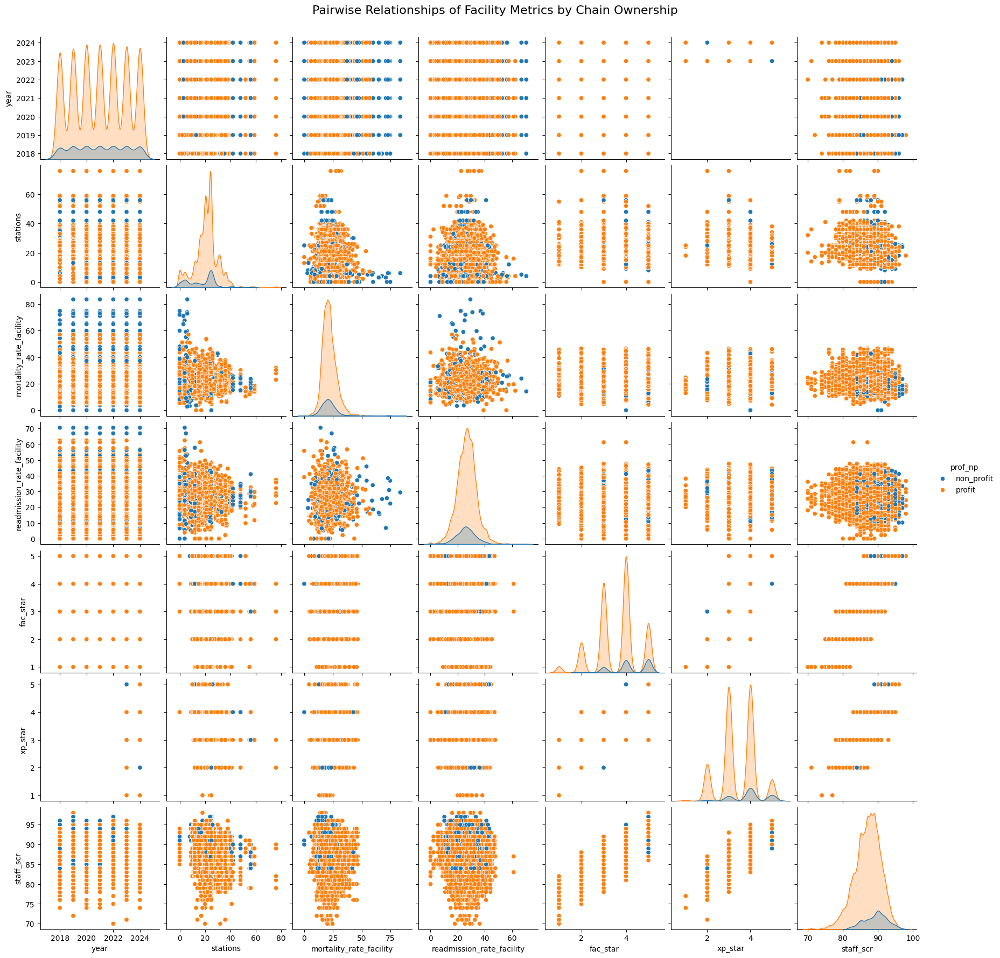

In [5]:
var_columns = ['year', 'stations','mortality_rate_facility', 'readmission_rate_facility', 'fac_star', 'xp_star', 'staff_scr']

# Create the pairplot with the filtered columns
g = sns.pairplot(data=fascility_records_df, vars=var_columns, hue='prof_np')

# Add a title to the entire pairplot
g.fig.suptitle("Pairwise Relationships of Facility Metrics by Chain Ownership", 
               fontsize=16, y=1.02)

Text(0.5, 1.02, 'Pairwise Relationships of Facility Metrics by Chain Ownership')

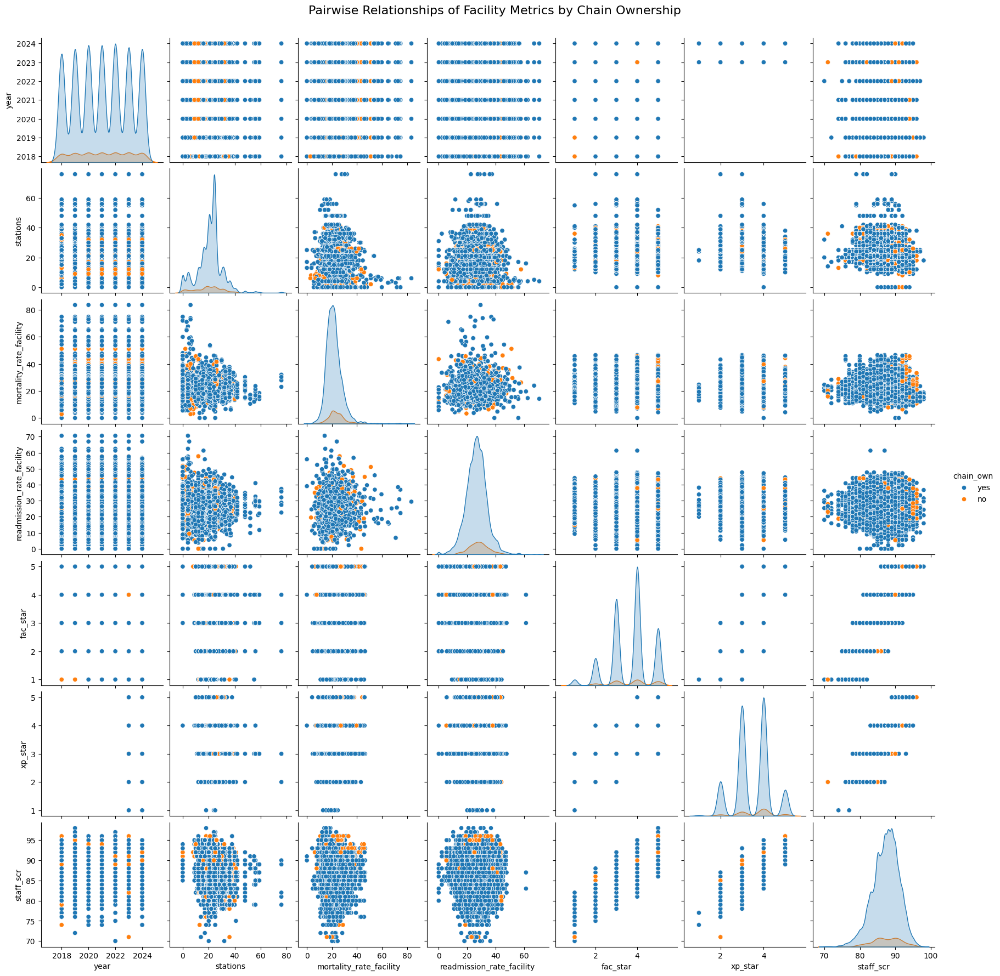

In [6]:
var_columns = ['year', 'stations','mortality_rate_facility', 'readmission_rate_facility', 'fac_star', 'xp_star', 'staff_scr']

# Create the pairplot with the filtered columns
g = sns.pairplot(data=fascility_records_df, vars=var_columns, hue='chain_own')

# Add a title to the entire pairplot
g.fig.suptitle("Pairwise Relationships of Facility Metrics by Chain Ownership", 
               fontsize=16, y=1.02)

# Aggregated Fascility Dataset

In [61]:
fascility_agg = db.fascility()
fascility_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 316 entries, 0 to 315
Data columns (total 19 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   county_name                            316 non-null    object 
 1   year                                   316 non-null    int64  
 2   fac_count                              316 non-null    int64  
 3   stations                               316 non-null    int64  
 4   prof_np                                316 non-null    float64
 5   chain_own                              316 non-null    float64
 6   survey_count                           316 non-null    int64  
 7   survey_rate                            78 non-null     float64
 8   fac_star                               275 non-null    float64
 9   xp_star                                78 non-null     float64
 10  comm_scr                               275 non-null    float64
 11  qualit

In [88]:

def load_fascility_coverage(db=None):
    
    if db is None:
        db = func.Database()
        
    # Create covereage view for fascility table
    coverage_columns = ['year', 'county_name', 'fac_count', 'stations', 'prof_np', 'chain_own']
    db.fascility.add_view('coverage', coverage_columns)
    
    # Create user_count view for medicare table
    user_count_columns = ['year', 'county_name', 'user_cnt']
    db.medicare.add_view('user_count', user_count_columns)
    
    # Merge the coverage and user_count views
    df = db.merge_views([('fascility', 'coverage'), ('medicare', 'user_count')]).copy()
    
    # Create per capita stations column
    df['stations_per_capita'] = df['stations'] / df['user_cnt']

    # Sort the dataframe by year and county_name
    df.sort_values(['year', 'county_name'])
    df.reset_index(drop=True)

    return df

fascility_coverage_df = load_fascility_coverage(db)
print(fascility_coverage_df.head())

    county_name  year  fac_count  stations   prof_np  chain_own  user_cnt  \
0       Alameda  2018      240.0    4733.0  0.820833        1.0    1455.0   
1         Butte  2018       32.0     584.0  0.750000        1.0     285.0   
2      Columbia  2018        2.0      26.0  1.000000        1.0       NaN   
3  Contra Costa  2018      137.0    2690.0  0.985401        1.0    1002.0   
4     El Dorado  2018        8.0     185.0  1.000000        1.0     125.0   

   stations_per_capita  
0             3.252921  
1             2.049123  
2                  NaN  
3             2.684631  
4             1.480000  


In [89]:

metric_list = ['fac_count', 'stations', 'prof_np', 'chain_own', 'user_cnt', 'stations_per_capita']
for metric in metric_list: 
    fig = choropleth(data=fascility_coverage_df, hue_column=metric, slider_column=None, title=f'{metric} by County in California')
    fig.show()

# Medicare Dataset:

## Task 1: Basic statistics and data overview of the 'voter' table

In [90]:
def load_medicare_race(db=None):
    
    if db is None:
        db = func.Database()
        
    # Load the medicare_race table    
    race_columns = ['county_name', 'feml_pct', 'male_pct', 'race_wht_pct', 'race_black_pct', 'race_hspnc_pct', 'race_othr_pct', 'dual_pct']
    db.medicare.add_view('race', race_columns)
    medicare_race = db.medicare.demographics.copy()
    other_columns = ['race_othr_pct', 'dual_pct']
    medicare_race['race_other'] = medicare_race[other_columns].sum(axis=1)
    medicare_race.drop(columns=other_columns, inplace=True)
    medicare_race.sort_values('county_name', inplace=True)
    medicare_race.reset_index(drop=True, inplace=True)
    
    return medicare_race

medicare_race = load_medicare_race(db)
# Display basic information about the voter table
print(medicare_race.info())

# Show summary statistics
print(medicare_race.describe())

# Display the first few rows
print(medicare_race.head())

# Check for missing values
print(medicare_race.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 531 entries, 0 to 530
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   county_name     522 non-null    object 
 1   feml_pct        522 non-null    float64
 2   male_pct        522 non-null    float64
 3   race_wht_pct    471 non-null    float64
 4   race_black_pct  471 non-null    float64
 5   race_hspnc_pct  471 non-null    float64
 6   race_other      531 non-null    float64
dtypes: float64(6), object(1)
memory usage: 29.2+ KB
None
         feml_pct    male_pct  race_wht_pct  race_black_pct  race_hspnc_pct  \
count  522.000000  522.000000    471.000000      471.000000      471.000000   
mean     0.529979    0.470021      0.716818        0.030964        0.159155   
std      0.015634    0.015634      0.163089        0.035756        0.129178   
min      0.467200    0.430100      0.214800        0.002300        0.028700   
25%      0.520925    0.458700      0.5

## Task 2: Visualize Race Distribution according to medicar edataset percentages

In [91]:
melted_medicare_race = pd.melt(medicare_race, id_vars=['county_name'], var_name='race', value_name='percentage')
melted_medicare_race['percentage'] = melted_medicare_race['percentage'].astype(float)


In [92]:
fig = choropleth(melted_medicare_race, 'percentage', 'race', 'Race Groups by County in California')
fig.show()

# Census Dataset:

## Task 1: Basic Stastical Analysis

In [30]:
age_group_columns = ['county_name','under_5_years','age_5_9','age_10_14','age_15_19','age_20_24','age_25_29','age_30_34','age_35_39','age_40_44', 'age_45_49','age_50_54','age_55_59','age_60_64','age_65_69','age_70_74', 'age_75_79', 'age_80_84', 'age_85_plus']

db.census.add_view('age_groups', age_group_columns)
census_age_groups = db.census.age_groups


 
race_columns =['county_name', 'white', 'black_or_african_american', 'hispanic_or_latino', 'asian', 'american_indian_and_alaska_native', 'native_hawaiian_and_other_pacific_islander', 'some_other_race', 'two_or_more_races']
db.census.add_view('race', race_columns)

def load_race_df(db=None):
    
    if db is None:
        db = func.Database()
    
        
    race_df = db.census.race.copy()
    other_columns = ['asian', 'native_hawaiian_and_other_pacific_islander','some_other_race', 'two_or_more_races', 'american_indian_and_alaska_native']
    # sum these values up ant group them as other: 'native_hawaiian_and_other_pacific_islander', 'some_other_race', 'two_or_more_races'
    race_df['race_other'] = race_df[other_columns].sum(axis=1)
    race_df.drop(columns=other_columns, inplace=True)
    race_df.sort_values('county_name', inplace=True)
    race_df.reset_index(drop=True, inplace=True)
    
    return race_df

race_df = load_race_df(db)
race_df.head()



,county_name,white,black_or_african_american,hispanic_or_latino,race_other
0,Alameda,31.1,9.8,23.4,59.0
1,Alpine,67.6,0.8,7.0,31.6
2,Amador,76.8,3.1,14.9,20.1
3,Butte,70.7,1.7,19.0,27.7
4,Calaveras,80.2,0.8,12.9,18.9


In [31]:
melted_age_group = pd.melt(census_age_groups, id_vars=['county_name'], var_name='age_group', value_name='percentage')
melted_age_group['percentage'] = melted_age_group['percentage'].astype(float)


melted_race = pd.melt(race_df, id_vars=['county_name'], var_name='race', value_name='percentage')
melted_race['percentage'] = melted_race['percentage'].astype(float)

def calculate_avg_age(df):
    """
    Calculate the estimated average age for each county using a weighted average.
    """
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()
    
    age_groups = {
        'under_5_years': 2.5,
        'age_5_9': 7,
        'age_10_14': 12,
        'age_15_19': 17,
        'age_20_24': 22,
        'age_25_29': 27,
        'age_30_34': 32,
        'age_35_39': 37,
        'age_40_44': 42,
        'age_45_49': 47,
        'age_50_54': 52,
        'age_55_59': 57,
        'age_60_64': 62,
        'age_65_69': 67,
        'age_70_74': 72,
        'age_75_79': 77,
        'age_80_84': 82,
        'age_85_plus': 90
    }
    
    weighted_columns = []
    for group, age in age_groups.items():
        weighted_column = f'{group}_weighted'
        df_copy.loc[:, weighted_column] = df_copy[group] * age
        weighted_columns.append(weighted_column)
    
    df_copy.loc[:, 'estimated_avg_age'] = df_copy[weighted_columns].sum(axis=1) / 100
    return df_copy

def create_stacked_bar_plot(df):
    """
    Create a stacked bar plot showing top 10 and bottom 10 counties based on estimated average age.
    """
    # Sort counties by estimated average age
    sorted_counties = df.sort_values('estimated_avg_age', ascending=False)
    
    # Get top 10 and bottom 10 counties
    top_10 = sorted_counties.head(10)
    bottom_10 = sorted_counties.tail(10)[::-1]  # Reverse to show in descending order
    
    # Combine top and bottom counties
    plot_data = pd.concat([top_10, bottom_10])
    
    # Create subplots
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Top 10 Counties by Avg Age', 'Bottom 10 Counties by Avg Age'))
    
    # Define age groups for stacking
    age_groups = ['under_5_years', 'age_5_9', 'age_10_14', 'age_15_19', 'age_20_24', 
                  'age_25_29', 'age_30_34', 'age_35_39', 'age_40_44', 'age_45_49', 
                  'age_50_54', 'age_55_59', 'age_60_64', 'age_65_69', 'age_70_74', 
                  'age_75_79', 'age_80_84', 'age_85_plus']
    
    # Color scale for age groups
    colors = px.colors.sequential.Viridis[::-1]  # Reverse Viridis color scale
    
    # Add bars for each age group
    for i, age_group in enumerate(age_groups):
        fig.add_trace(
            go.Bar(
                x=plot_data['county_name'][:10],
                y=plot_data[age_group][:10],
                name=age_group,
                marker_color=colors[i % len(colors)]
            ),
            row=1, col=1
        )
        fig.add_trace(
            go.Bar(
                x=plot_data['county_name'][10:],
                y=plot_data[age_group][10:],
                name=age_group,
                marker_color=colors[i % len(colors)],
                showlegend=False
            ),
            row=1, col=2
        )
    
    # Update layout
    fig.update_layout(
        barmode='stack',
        title='Age Distribution in California Counties',
        height=600,
        width=1200
    )
    
    # Update x-axis
    fig.update_xaxes(title_text="County", tickangle=45, row=1, col=1)
    fig.update_xaxes(title_text="County", tickangle=45, row=1, col=2)
    
    # Update y-axis
    fig.update_yaxes(title_text="Percentage", row=1, col=1)
    fig.update_yaxes(title_text="Percentage", row=1, col=2)
    
    return fig


In [32]:
fig = choropleth(melted_race, 'percentage', 'race', 'Race Groups by County in California')
fig.show()

In [ ]:
fig = choropleth(melted_age_group, 'percentage', 'age_group', 'Age Groups by County in California')
fig.show()

df = calculate_avg_age(census_age_groups)
fig = create_stacked_bar_plot(df)
fig.show()

In [16]:
def create_full_age_distribution_heatmap(df):
    """
    Create a heatmap showing age distribution for all California counties.
    """
    # Sort counties by estimated average age
    sorted_counties = df.sort_values('estimated_avg_age', ascending=False)
    
    # Define age groups
    age_groups = ['under_5_years', 'age_5_9', 'age_10_14', 'age_15_19', 'age_20_24', 
                  'age_25_29', 'age_30_34', 'age_35_39', 'age_40_44', 'age_45_49', 
                  'age_50_54', 'age_55_59', 'age_60_64', 'age_65_69', 'age_70_74', 
                  'age_75_79', 'age_80_84', 'age_85_plus']
    
    # Prepare data for heatmap
    heatmap_data = sorted_counties[age_groups]
    
    # Create heatmap
    fig = go.Figure(data=go.Heatmap(
        z=heatmap_data.values,
        y=sorted_counties['county_name'],
        x=age_groups,
        colorscale='Viridis',
        colorbar=dict(title='Percentage'),
    ))
    
    # Update layout
    fig.update_layout(
        title='Age Distribution in All California Counties (Sorted by Average Age)',
        yaxis_title='County',
        xaxis_title='Age Group',
        xaxis_tickangle=-45,
        height=1500,  # Increased height to accommodate all counties
        width=1000,
    )
    
    # Add annotations for average age
    for i, county in enumerate(sorted_counties['county_name']):
        fig.add_annotation(
            y=county,
            x='age_85_plus',
            text=f"{sorted_counties['estimated_avg_age'].iloc[i]:.1f}",
            showarrow=False,
            xshift=50,
            font=dict(size=8)
        )
    
    return fig

# Usage:
df = calculate_avg_age(census_age_groups)
fig = create_full_age_distribution_heatmap(df)
fig.show()

# Census vs Medicare Race Groups

Statistical Analysis of Race Distribution Across California Counties.

Our study aimed to merge data from two distinct sources: government census and Medicare datasets. To justify this merger, we needed to establish that both datasets were drawn from fundamentally similar populations, despite different collection methodologies. We chose to compare race distribution, a demographic feature present in both datasets, as our benchmark. Our rationale was that if the race distributions were statistically similar across counties, it would suggest that the two samples were likely drawn from the same underlying population. This similarity would provide a strong foundation for merging other features from these datasets in subsequent analyses. We employed chi-square tests with Bonferroni correction to rigorously assess the similarity of race distributions across California counties. The results showed remarkable consistency, supporting our approach to combine these datasets for further modeling and analysis.

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
from statsmodels.stats.multitest import multipletests

df1 = load_race_df(db)
df2 = load_medicare_race(db)

# Function to perform chi-square test
def chi_square_test(row1, row2):
    # Ensure the order of categories is the same
    categories1 = ['white', 'black_or_african_american', 'hispanic_or_latino', 'race_other']
    categories2 = ['race_wht_pct', 'race_black_pct', 'race_hspnc_pct', 'race_other']
    observed = np.array([
        [row1[cat] for cat in categories1],
        [row2[cat] for cat in categories2]
    ])
    chi2, p_value, dof, expected = chi2_contingency(observed)
    return p_value

# Prepare df2 by grouping and summing percentages for each county
df2_grouped = df2.groupby('county_name').agg({
    'race_wht_pct': 'first',
    'race_black_pct': 'first',
    'race_hspnc_pct': 'first',
    'race_other': 'first'
}).reset_index()

# Perform chi-square test for each county
results = {}
for county in df1['county_name']:
    if county in df2_grouped['county_name'].values:
        row1 = df1[df1['county_name'] == county].iloc[0]
        row2 = df2_grouped[df2_grouped['county_name'] == county].iloc[0]
        p_value = chi_square_test(row1, row2)
        results[county] = p_value

# Adjust p-values for multiple comparisons using Bonferroni correction
adjusted_p_values = multipletests([v for v in results.values()], method='bonferroni')[1]

# Create a results dataframe
results_df = pd.DataFrame({
    'County': list(results.keys()),
    'P-value': list(results.values()),
    'Adjusted P-value': adjusted_p_values
})

# Sort results by adjusted p-value
results_df = results_df.sort_values('Adjusted P-value')

# Print results
print(results_df)

# Optionally, save results to a CSV file
results_df.to_csv('chi_square_results.csv', index=False)

print("\nCounties with similar distributions (adjusted p-value > 0.05):")
print(results_df[results_df['Adjusted P-value'] > 0.05]['County'].tolist())

print("\nCounties with different distributions (adjusted p-value <= 0.05):")
print(results_df[results_df['Adjusted P-value'] <= 0.05]['County'].tolist())